<center><h1>Proyecto Bedu:Predicción de ataque cardíaco</h1></center>
<hr>

![Imagen representativa de Ataque Cardiaco](https://storage.googleapis.com/kaggle-datasets-images/4327876/7436271/3589e092fb28cfd66006c7cb823b2a90/dataset-cover.jpg?t=2024-01-19-16-29-28)

<h2>Contexto del Dataset</h2>

Este conjunto de datos, compilado en 1988, abarca información de cuatro bases de datos distintas: Cleveland, Hungría, Suiza y Long Beach V. El conjunto de datos, que comprende 76 atributos, incluido el atributo predicho, se ha utilizado predominantemente en experimentos publicados que se centran en un subconjunto de 14 características clave. El campo crítico "objetivo" indica el porcentaje de riesgo de ataque cardíaco en los pacientes.

La enfermedad cardíaca, término colectivo para las dolencias que afectan al corazón y al sistema circulatorio, es un problema de salud mundial y una de las principales causas de discapacidad. Dado el papel fundamental del corazón en las funciones corporales, las enfermedades que lo afectan pueden tener consecuencias de gran alcance en otros órganos y procesos fisiológicos. Existen varias formas de enfermedades cardíacas, incluidas aquellas que causan estrechamiento de las arterias coronarias, mal funcionamiento de las válvulas, agrandamiento del corazón y más, y que a menudo conducen a insuficiencia cardíaca y ataques cardíacos.

Este conjunto de datos, diseñado específicamente para enfermedades cardíacas, proporciona un recurso valioso para extraer conocimientos que iluminen la importancia de cada característica y sus interrelaciones. En este análisis, nuestro objetivo principal es determinar la probabilidad de que un individuo sea susceptible a un problema cardíaco grave.

<h3>Diccionario de datos</h3>


| Característica                                  | Descripción                                                                                          |
|------------------------------------------------|------------------------------------------------------------------------------------------------------|
| Edad                                           | Edad del paciente en años.                                                                          |
| Sexo                                           | Género del paciente (0: Mujer, 1: Hombre).                                                          |
| Tipo de dolor en el pecho                      | Tipo de dolor experimentado en el pecho (0: Angina típica, 1: Angina atípica, 2: Dolor no anginoso, 3: Asintomático). |
| Presión arterial en reposo                     | Presión arterial del paciente en estado de reposo.                                                  |
| Colesterol sérico                              | Nivel de colesterol en la sangre del paciente en mg/dL.                                             |
| Azúcar en sangre en ayunas                    | Nivel de azúcar en sangre en ayunas (0: <= 120 mg/dL, 1: > 120 mg/dL).                             |
| Resultados electrocardiográficos en reposo    | Resultados del electrocardiograma en estado de reposo (0: Normal, 1: Anormalidad, 2: Hipertrofia). |
| Frecuencia cardíaca máxima alcanzada          | Frecuencia cardíaca máxima alcanzada por el paciente durante el ejercicio.                          |
| Angina inducida por el ejercicio              | Indica si el paciente experimenta angina durante el ejercicio (0: No, 1: Sí).                       |
| Oldpeak (Depresión ST)                        | Depresión del segmento ST inducida por el ejercicio.                                                |
| Pendiente del segmento ST de ejercicio máximo | Pendiente del segmento ST durante la prueba de esfuerzo (0: Ascendente, 1: Plano, 2: Descendente).  |
| Número de vasos principales coloreados        | Número de vasos principales coloreados durante un procedimiento de fluoroscopia.                     |
| Talasemia                                      | Presencia de talasemia en el paciente (0: Normal, 1: Defecto fijo, 2: Defecto reversible).           |
| Porcentaje                                        | Porcentaje de riesgo de ataque cardíaco en los pacientes.                                            |


<center><h2>Importacion de Librerias</h2></center>

<hr>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn import tree
from sklearn.model_selection import GridSearchCV
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from collections import Counter
from wordcloud import WordCloud
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold, cross_val_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.tree import plot_tree

<center><h2>Extraccion de Datos</h2></center>

In [2]:
# Leer el archivo Excel desde la URL utilizando el motor openpyxl
#Se usa openpyxl para leer el archivo Excel porque es compatible con los formatos más recientes.
url = ('https://raw.githubusercontent.com/DYI-murri/ProyectoBedu/main/heart.xlsx')
df = pd.read_excel(url, engine='openpyxl')

# Renombrar las columnas hace que el DataFrame sea más comprensible y Se utiliza un diccionario para especificar los nuevos
#nombres de las columnas porque es una forma eficiente y clara de asignar nombres a múltiples columnas al mismo tiempo. 
nuevos_nombres = {
    "age": "Edad",
    "sex": "Sexo",
    "cp": "Tipo_dolor_de_pecho",
    "trestbps": "Presion_arterial_en_reposo",
    "chol": "Colesterol_serico",
    "fbs": "Azucar_en_ayunas",
    "restecg": "Resultados_electrocardiográficos_en_reposo",
    "thalach": "Frecuencia_cardíaca_máxima_alcanzada",
    "exang": "Angina_inducida_por_el_ejercicio",
    "oldpeak": "Depresión_ST",
    "slope": "Pendiente_del_segmento_ST_del_ejercicio_máximo",
    "ca": "Número_de_vasos_principales_coloreados_por_fluoroscopia",
    "thal": "Talasemia",
    "target": "Porcentaje_de_Riesgo",
}

# Renombrar las columnas utilizando el método rename()
df = df.rename(columns=nuevos_nombres)

# Mostrar las primeras 5 filas del DataFrame para verificar los cambios
df.head(5)



,Edad,Sexo,Tipo_dolor_de_pecho,Presion_arterial_en_reposo,Colesterol_serico,Azucar_en_ayunas,Resultados_electrocardiográficos_en_reposo,Frecuencia_cardíaca_máxima_alcanzada,Angina_inducida_por_el_ejercicio,Depresión_ST,Pendiente_del_segmento_ST_del_ejercicio_máximo,Número_de_vasos_principales_coloreados_por_fluoroscopia,Talasemia,Porcentaje_de_Riesgo
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0.23
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0.37
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0.24
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0.28
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0.21


<center><h2>Analisis del conjunto de Datos</h2></center>
<hr>

In [3]:
#Esta funcion nos da información básica sobre un DataFrame, incluyendo el tipo de datos de cada columna, la cantidad de valores
#no nulos, y la cantidad de memoria utilizada por el DataFrame.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1025 entries, 0 to 1024
Data columns (total 14 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Edad                                                     1025 non-null   int64  
 1   Sexo                                                     1025 non-null   int64  
 2   Tipo_dolor_de_pecho                                      1025 non-null   int64  
 3   Presion_arterial_en_reposo                               1025 non-null   int64  
 4   Colesterol_serico                                        1025 non-null   int64  
 5   Azucar_en_ayunas                                         1025 non-null   int64  
 6   Resultados_electrocardiográficos_en_reposo               1025 non-null   int64  
 7   Frecuencia_cardíaca_máxima_alcanzada                     1025 non-null   int64  
 8   Angina_inducida_por_el_ejerc

<div class="alert alert-block alert-info">
<b>El resultado nos dice que el dataset contiene 14 columnas, 1025 filas y que no hay valores nulos, ademas de que incluyen valores  enteros y flotantes y el espacio de memoria es de 112.2 KB</b>
</div>

<h2>Estimados de Locacion y Variabilidad </h2>

Los estimados de locación y variabilidad son conceptos estadísticos que se utilizan para describir la distribución de un conjunto de datos:

    -Estimados de Locación: Son medidas que nos indican la posición central de los datos, es decir, dónde se concentran los valores. Algunos estimados de locación comunes son la media, la mediana y la moda. La media es el promedio de los valores, la mediana es el valor que divide al conjunto de datos en dos partes iguales y la moda es el valor que aparece con mayor frecuencia.

    -Estimados de Variabilidad: Son medidas que nos indican qué tan dispersos están los datos alrededor de su centro. Cuanto mayor sea la variabilidad, más dispersos estarán los datos. Algunos estimados de variabilidad comunes son el rango, la desviación estándar y el rango intercuartílico. El rango es la diferencia entre el valor máximo y mínimo, la desviación estándar mide la dispersión promedio de los datos respecto a la media, y el rango intercuartílico es la diferencia entre el tercer y primer cuartil, lo que indica la dispersión de la mitad central de los datos.

In [4]:
#Este metodo proporciona un resumen estadístico de un DataFrame. Este método calcula varias estadísticas descriptivas para todas
#las columnas numéricas del DataFrame, como count, mean, std (desviación estándar), min, 25% (percentil 25), 50% (percentil 50,
#equivalente a la mediana), 75% (percentil 75) y max.
df.describe()

,Edad,Sexo,Tipo_dolor_de_pecho,Presion_arterial_en_reposo,Colesterol_serico,Azucar_en_ayunas,Resultados_electrocardiográficos_en_reposo,Frecuencia_cardíaca_máxima_alcanzada,Angina_inducida_por_el_ejercicio,Depresión_ST,Pendiente_del_segmento_ST_del_ejercicio_máximo,Número_de_vasos_principales_coloreados_por_fluoroscopia,Talasemia,Porcentaje_de_Riesgo
count,1025.000000,1025.000000,1025.000000,1025.000000,1025.00000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000
mean,54.434146,0.695610,0.942439,131.611707,246.00000,0.149268,0.529756,149.114146,0.336585,1.071512,1.385366,0.754146,2.323902,0.536390
std,9.072290,0.460373,1.029641,17.516718,51.59251,0.356527,0.527878,23.005724,0.472772,1.175053,0.617755,1.030798,0.620660,0.285822
min,29.000000,0.000000,0.000000,94.000000,126.00000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000
25%,48.000000,0.000000,0.000000,120.000000,211.00000,0.000000,0.000000,132.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.260000
50%,56.000000,1.000000,1.000000,130.000000,240.00000,0.000000,1.000000,152.000000,0.000000,0.800000,1.000000,0.000000,2.000000,0.710000
75%,61.000000,1.000000,2.000000,140.000000,275.00000,0.000000,1.000000,166.000000,1.000000,1.800000,2.000000,1.000000,3.000000,0.810000
max,77.000000,1.000000,3.000000,200.000000,564.00000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,0.900000


<div class="alert alert-block alert-info">
<b>  -Edad: La media de edad es aproximadamente 54.43 años, con una desviación estándar de alrededor de 9.07. Esto indica que, en promedio, los pacientes tienen alrededor de 54 años, y la dispersión de las edades alrededor de esta media es relativamente pequeña.

  

-Sexo: La media de sexo es aproximadamente 0.70, lo que indica que la mayoría de los pacientes en el conjunto de datos son hombres (1) en lugar de mujeres (0), ya que la media está más cerca de 1.

-Tipo de dolor de pecho: La media es de aproximadamente 0.94, lo que sugiere que la mayoría de los pacientes tienen algún tipo de dolor en el pecho. Los valores de esta columna son categóricos, por lo que estos números no tienen un significado numérico real más allá de identificar diferentes tipos de dolor.

-Presión arterial en reposo: La media de presión arterial en reposo es de aproximadamente 131.61 mmHg, con una desviación estándar de alrededor de 17.52 mmHg. Esto indica que la presión arterial en reposo varía significativamente entre los pacientes, pero en promedio, es de alrededor de 131 mmHg.

-Colesterol sérico: La media de colesterol sérico es de aproximadamente 246 mg/dL, con una desviación estándar de alrededor de 51.59 mg/dL. Esto sugiere que hay una variabilidad considerable en los niveles de colesterol entre los pacientes.

-Azúcar en ayunas: La mayoría de los pacientes tienen un nivel de azúcar en sangre en ayunas bajo, ya que la media es aproximadamente 0.15, lo que indica que la mayoría de los pacientes tienen un valor de 0 (<= 120 mg/dL) en lugar de 1 (> 120 mg/dL).</b>
</div>

In [5]:
# Calcular la media de todas las columnas
media = df.mean()


print("Media de todas las columnas:")
print(media)


Media de todas las columnas:
Edad                                                        54.434146
Sexo                                                         0.695610
Tipo_dolor_de_pecho                                          0.942439
Presion_arterial_en_reposo                                 131.611707
Colesterol_serico                                          246.000000
Azucar_en_ayunas                                             0.149268
Resultados_electrocardiográficos_en_reposo                   0.529756
Frecuencia_cardíaca_máxima_alcanzada                       149.114146
Angina_inducida_por_el_ejercicio                             0.336585
Depresión_ST                                                 1.071512
Pendiente_del_segmento_ST_del_ejercicio_máximo               1.385366
Número_de_vasos_principales_coloreados_por_fluoroscopia      0.754146
Talasemia                                                    2.323902
Porcentaje_de_Riesgo                                         

<div class="alert alert-block alert-info">
<b>-Edad: La edad promedio de los individuos en el conjunto de datos es de aproximadamente 54 años. Esto indica que la población estudiada tiende a ser de mediana edad.

-Sexo: La media de la variable sexo es aproximadamente 0.70. Si 0 representa a las mujeres y 1 a los hombres, entonces esto sugiere que hay más hombres que mujeres en el conjunto de datos.

-Tipo de dolor de pecho: La media de esta variable indica que el tipo de dolor de pecho se encuentra predominantemente en el rango más bajo de las categorías, ya que la media está más cerca de 1.

-Presión arterial en reposo: Con una media de alrededor de 131.61 mmHg, la presión arterial en reposo promedio cae en el rango normal, aunque puede variar dependiendo de la población estudiada y los criterios de diagnóstico.

-Colesterol sérico: La media de 246.00 mg/dL indica un nivel de colesterol sérico en el rango elevado.

-Azúcar en ayunas: Con una media de aproximadamente 0.15, indica que la mayoría de los individuos tienen niveles normales de azúcar en ayunas.

-Resultados del electrocardiograma en reposo: La media de alrededor de 0.53 sugiere que la mayoría de los individuos tienen resultados normales en el electrocardiograma en reposo.

-Frecuencia cardíaca máxima alcanzada: La media de 149.11 latidos por minuto indica la frecuencia cardíaca promedio durante el esfuerzo máximo.

-Angina inducida por el ejercicio: La media de aproximadamente 0.34 indica que la presencia de angina inducida por el ejercicio es relativamente baja en promedio.

-Depresión del segmento ST: Con una media de aproximadamente 1.07, indica una cierta cantidad de depresión del segmento ST en promedio.

-Pendiente del segmento ST durante el ejercicio máximo: La media de aproximadamente 1.39 sugiere una pendiente moderada del segmento ST durante el ejercicio máximo.

-Número de vasos principales coloreados por fluoroscopia: Con una media de alrededor de 0.75, indica que en promedio, se observan algunos vasos principales coloreados por fluoroscopia.

-Talasemia: La media de aproximadamente 2.32 indica un cierto grado de talasemia en promedio.

-Porcentaje de riesgo: Con una media de aproximadamente 0.54, indica el porcentaje de riesgo promedio de la población estudiada.</b>
</div>

In [6]:
# Calcular la mediana de todas las columnas
mediana = df.median()

print("\nMediana de todas las columnas:")
print(mediana)


Mediana de todas las columnas:
Edad                                                        56.00
Sexo                                                         1.00
Tipo_dolor_de_pecho                                          1.00
Presion_arterial_en_reposo                                 130.00
Colesterol_serico                                          240.00
Azucar_en_ayunas                                             0.00
Resultados_electrocardiográficos_en_reposo                   1.00
Frecuencia_cardíaca_máxima_alcanzada                       152.00
Angina_inducida_por_el_ejercicio                             0.00
Depresión_ST                                                 0.80
Pendiente_del_segmento_ST_del_ejercicio_máximo               1.00
Número_de_vasos_principales_coloreados_por_fluoroscopia      0.00
Talasemia                                                    2.00
Porcentaje_de_Riesgo                                         0.71
dtype: float64


<div class="alert alert-block alert-info">
<b>-Edad: La mediana de la edad es 56 años, lo que significa que la mitad de las personas en el conjunto de datos tienen 56 años o menos, y la otra mitad tiene 56 años o más.

-Sexo: La mediana es 1.00, lo que indica que la mitad de los individuos son hombres (1) y la otra mitad son mujeres (0).

-Tipo de dolor de pecho: La mediana es 1.00, lo que sugiere que el tipo de dolor de pecho más comúnmente experimentado cae en la categoría 1.

-Presión arterial en reposo: La mediana es 130.00 mmHg, lo que significa que la mitad de las personas tienen una presión arterial en reposo de 130 mmHg o menos, y la otra mitad tiene una presión arterial mayor de 130 mmHg.

-Colesterol sérico: La mediana es 240.00 mg/dL, lo que indica que la mitad de las personas tienen un nivel de colesterol sérico de 240 mg/dL o menos, y la otra mitad tiene un nivel de colesterol sérico superior a 240 mg/dL.

-Azúcar en ayunas: La mediana es 0.00, lo que sugiere que la mayoría de las personas tienen un nivel de azúcar en ayunas de 0 mg/dL.

-Resultados del electrocardiograma en reposo: La mediana es 1.00, lo que indica que la mitad de las personas tienen resultados normales en el electrocardiograma en reposo (valor 1), y la otra mitad tienen resultados anormales (valor 0).

-Frecuencia cardíaca máxima alcanzada: La mediana es 152.00 latidos por minuto, lo que significa que la mitad de las personas alcanzaron una frecuencia cardíaca máxima de 152 latidos por minuto o menos durante el ejercicio máximo, y la otra mitad tuvo una frecuencia cardíaca máxima superior a 152 latidos por minuto.

-Angina inducida por el ejercicio: La mediana es 0.00, lo que sugiere que la mayoría de las personas no experimentaron angina inducida por el ejercicio.

-Depresión del segmento ST: La mediana es 0.80, lo que indica que la mitad de las personas tienen una depresión del segmento ST de 0.80 o menos.

-Pendiente del segmento ST durante el ejercicio máximo: La mediana es 1.00, lo que sugiere una pendiente moderada del segmento ST durante el ejercicio máximo para la mayoría de las personas.

-Número de vasos principales coloreados por fluoroscopia: La mediana es 0.00, lo que indica que la mayoría de las personas no tienen vasos principales coloreados por fluoroscopia.

-Talasemia: La mediana es 2.00, lo que sugiere un grado moderado de talasemia para la mayoría de las personas.

-Porcentaje de riesgo: La mediana es 0.71, lo que significa que el 50% de los individuos tienen un riesgo de enfermedad cardíaca del 71% o menos.</b>
</div>

In [7]:
# Calcular la moda de todas las columnas
moda = df.mode().iloc[0]  # En caso de que haya múltiples modas, se toma la primera

print("\nModa de todas las columnas:")
print(moda)


Moda de todas las columnas:
Edad                                                        58.00
Sexo                                                         1.00
Tipo_dolor_de_pecho                                          0.00
Presion_arterial_en_reposo                                 120.00
Colesterol_serico                                          204.00
Azucar_en_ayunas                                             0.00
Resultados_electrocardiográficos_en_reposo                   1.00
Frecuencia_cardíaca_máxima_alcanzada                       162.00
Angina_inducida_por_el_ejercicio                             0.00
Depresión_ST                                                 0.00
Pendiente_del_segmento_ST_del_ejercicio_máximo               1.00
Número_de_vasos_principales_coloreados_por_fluoroscopia      0.00
Talasemia                                                    2.00
Porcentaje_de_Riesgo                                         0.78
Name: 0, dtype: float64


<div class="alert alert-block alert-info">
<b>-Edad: La moda es 58.00 años, lo que significa que el valor más común de edad en el conjunto de datos es 58 años.

-Sexo: La moda es 1.00, lo que indica que el valor más común para el sexo es 1, lo que probablemente corresponde a hombres.

-Tipo de dolor de pecho: La moda es 0.00, lo que sugiere que el tipo de dolor de pecho más comúnmente experimentado es de tipo 0.

-Presión arterial en reposo: La moda es 120.00 mmHg, lo que significa que el valor más común de la presión arterial en reposo en el conjunto de datos es 120 mmHg.

-Colesterol sérico: La moda es 204.00 mg/dL, lo que indica que el valor más común de colesterol sérico en el conjunto de datos es 204 mg/dL.

-Azúcar en ayunas: La moda es 0.00, lo que sugiere que el valor más común para el nivel de azúcar en ayunas es 0 mg/dL.

-Resultados del electrocardiograma en reposo: La moda es 1.00, lo que indica que el valor más común para los resultados del electrocardiograma en reposo es 1, lo que probablemente corresponda a resultados normales.

-Frecuencia cardíaca máxima alcanzada: La moda es 162.00 latidos por minuto, lo que significa que el valor más común de la frecuencia cardíaca máxima alcanzada durante el ejercicio máximo es 162 latidos por minuto.

-Angina inducida por el ejercicio: La moda es 0.00, lo que sugiere que el valor más común para la presencia de angina inducida por el ejercicio es 0, lo que probablemente indica que la mayoría de las personas no experimentaron angina durante el ejercicio.

-Depresión del segmento ST: La moda es 0.00, lo que indica que el valor más común para la depresión del segmento ST es 0.

-Pendiente del segmento ST durante el ejercicio máximo: La moda es 1.00, lo que sugiere que la mayoría de las personas tienen una pendiente del segmento ST de 1 durante el ejercicio máximo.

-Número de vasos principales coloreados por fluoroscopia: La moda es 0.00, lo que indica que el valor más común para el número de vasos principales coloreados por fluoroscopia es 0.

-Talasemia: La moda es 2.00, lo que sugiere que el valor más común para el grado de talasemia es 2.

-Porcentaje de riesgo: La moda es 0.78, lo que significa que el valor más común para el porcentaje de riesgo es 0.78.</b>
</div>

In [8]:
# Calcula el rango de todas las columnas
rango = df.max() - df.min()

print("Rango de todas las columnas:")
print(rango)

Rango de todas las columnas:
Edad                                                        48.0
Sexo                                                         1.0
Tipo_dolor_de_pecho                                          3.0
Presion_arterial_en_reposo                                 106.0
Colesterol_serico                                          438.0
Azucar_en_ayunas                                             1.0
Resultados_electrocardiográficos_en_reposo                   2.0
Frecuencia_cardíaca_máxima_alcanzada                       131.0
Angina_inducida_por_el_ejercicio                             1.0
Depresión_ST                                                 6.2
Pendiente_del_segmento_ST_del_ejercicio_máximo               2.0
Número_de_vasos_principales_coloreados_por_fluoroscopia      4.0
Talasemia                                                    3.0
Porcentaje_de_Riesgo                                         0.8
dtype: float64


<div class="alert alert-block alert-info">
<b>-Edad: La diferencia entre la edad máxima y la edad mínima en años en tu conjunto de datos es de 48 años.
    
-Sexo: La diferencia entre el valor máximo (probablemente 1 para "masculino") y el valor mínimo (probablemente 0 para "femenino") es de 1.

-Tipo_dolor_de_pecho: La diferencia entre el tipo de dolor de pecho máximo y mínimo es de 3.

-Presion_arterial_en_reposo: La diferencia entre la presión arterial máxima y mínima en reposo es de 106 unidades (probablemente mmHg).

-Colesterol_serico: La diferencia entre el nivel máximo y mínimo de colesterol sérico es de 438 unidades.

-Azucar_en_ayunas: La diferencia entre los niveles máximos y mínimos de azúcar en sangre en ayunas es de 1 unidad.

-Resultados_electrocardiográficos_en_reposo: La diferencia entre los resultados máximos y mínimos del electrocardiograma en reposo es de 2 unidades.

-Frecuencia_cardíaca_máxima_alcanzada: La diferencia entre la frecuencia cardíaca máxima alcanzada durante el ejercicio (máximo) y la mínima es de 131 unidades (probablemente latidos por minuto).

-Angina_inducida_por_el_ejercicio: La diferencia entre la angina inducida máxima y mínima por el ejercicio es de 1.

-Depresión_ST: La diferencia entre la máxima y mínima depresión del segmento ST es de 6.2 unidades.

-Pendiente_del_segmento_ST_del_ejercicio_máximo: La diferencia entre la máxima y mínima pendiente del segmento ST durante el ejercicio máximo es de 2.

-Número_de_vasos_principales_coloreados_por_fluoroscopia: La diferencia entre el máximo y el mínimo número de vasos principales coloreados por fluoroscopia es de 4.

-Talasemia: La diferencia entre los máximos y mínimos valores de talasemia es de 3.

-Porcentaje_de_Riesgo: La diferencia entre el máximo y mínimo porcentaje de riesgo es de 0.8 unidades.</b>
</div>

In [9]:
# Calcula la desviación estándar de todas las columnas
desviacion_estandar = df.std()

print("\nDesviación estándar de todas las columnas:")
print(desviacion_estandar)


Desviación estándar de todas las columnas:
Edad                                                        9.072290
Sexo                                                        0.460373
Tipo_dolor_de_pecho                                         1.029641
Presion_arterial_en_reposo                                 17.516718
Colesterol_serico                                          51.592510
Azucar_en_ayunas                                            0.356527
Resultados_electrocardiográficos_en_reposo                  0.527878
Frecuencia_cardíaca_máxima_alcanzada                       23.005724
Angina_inducida_por_el_ejercicio                            0.472772
Depresión_ST                                                1.175053
Pendiente_del_segmento_ST_del_ejercicio_máximo              0.617755
Número_de_vasos_principales_coloreados_por_fluoroscopia     1.030798
Talasemia                                                   0.620660
Porcentaje_de_Riesgo                                       

<div class="alert alert-block alert-info">
<b>-Edad: La edad de las personas en tu conjunto de datos tiende a variar en promedio alrededor de 9.07 años con respecto a la media.

-Sexo: La desviación estándar para el sexo es baja, lo que indica que hay poca variabilidad en este atributo.

-Tipo_dolor_de_pecho: La variabilidad en el tipo de dolor de pecho es de aproximadamente 1.03 unidades.

-Presion_arterial_en_reposo: La presión arterial en reposo varía en promedio alrededor de 17.52 unidades (probablemente mmHg) con respecto a la media.

-Colesterol_serico: La desviación estándar del colesterol sérico es de aproximadamente 51.59 unidades.

-Azucar_en_ayunas: La variabilidad en el nivel de azúcar en sangre en ayunas es de alrededor de 0.36 unidades.

-Resultados_electrocardiográficos_en_reposo: La variabilidad en los resultados del electrocardiograma en reposo es de aproximadamente 0.53 unidades.

-Frecuencia_cardíaca_máxima_alcanzada: La frecuencia cardíaca máxima alcanzada durante el ejercicio varía en promedio alrededor de 23.01 latidos por minuto con respecto a la media.

-Angina_inducida_por_el_ejercicio: La desviación estándar para la angina inducida por el ejercicio es de aproximadamente 0.47.

-Depresión_ST: La variabilidad en la depresión del segmento ST es de alrededor de 1.18 unidades.

-Pendiente_del_segmento_ST_del_ejercicio_máximo: La variabilidad en la pendiente del segmento ST durante el ejercicio máximo es de aproximadamente 0.62 unidades.

-Número_de_vasos_principales_coloreados_por_fluoroscopia: La desviación estándar para el número de vasos principales coloreados por fluoroscopia es de aproximadamente 1.03.

-Talasemia: La variabilidad en los valores de talasemia es de alrededor de 0.62 unidades.

-Porcentaje_de_Riesgo: La desviación estándar para el porcentaje de riesgo es de aproximadamente 0.29 unidades.</b>
</div>

In [10]:
# Calcula el rango intercuartílico de todas las columnas
iqr = df.quantile(0.75) - df.quantile(0.25)

print("\nRango intercuartílico de todas las columnas:")
print(iqr)


Rango intercuartílico de todas las columnas:
Edad                                                       13.00
Sexo                                                        1.00
Tipo_dolor_de_pecho                                         2.00
Presion_arterial_en_reposo                                 20.00
Colesterol_serico                                          64.00
Azucar_en_ayunas                                            0.00
Resultados_electrocardiográficos_en_reposo                  1.00
Frecuencia_cardíaca_máxima_alcanzada                       34.00
Angina_inducida_por_el_ejercicio                            1.00
Depresión_ST                                                1.80
Pendiente_del_segmento_ST_del_ejercicio_máximo              1.00
Número_de_vasos_principales_coloreados_por_fluoroscopia     1.00
Talasemia                                                   1.00
Porcentaje_de_Riesgo                                        0.55
dtype: float64


In [11]:
# Definir los percentiles que se desean calcular
percentiles = [0.25, 0.50, 0.75]

# Calcular los percentiles para cada columna
percentiles_df = df.quantile(percentiles)

# Imprimir un mensaje informativo
print("\nPercentiles calculados para los siguientes percentiles:", percentiles)

# Imprimir los percentiles de todas las columnas
print("\nPercentiles de todas las columnas:")
print(percentiles_df)




Percentiles calculados para los siguientes percentiles: [0.25, 0.5, 0.75]

Percentiles de todas las columnas:
      Edad  Sexo  Tipo_dolor_de_pecho  Presion_arterial_en_reposo   
0.25  48.0   0.0                  0.0                       120.0  \
0.50  56.0   1.0                  1.0                       130.0   
0.75  61.0   1.0                  2.0                       140.0   

      Colesterol_serico  Azucar_en_ayunas   
0.25              211.0               0.0  \
0.50              240.0               0.0   
0.75              275.0               0.0   

      Resultados_electrocardiográficos_en_reposo   
0.25                                         0.0  \
0.50                                         1.0   
0.75                                         1.0   

      Frecuencia_cardíaca_máxima_alcanzada  Angina_inducida_por_el_ejercicio   
0.25                                 132.0                               0.0  \
0.50                                 152.0                    

<div class="alert alert-block alert-info">
<b>-Edad: El 25% de las edades en tu conjunto de datos son 48 años o menos, la mediana (percentil 50) es 56 años y el 75% de las edades son 61 años o menos.

-Sexo: El 25% de los datos son de sexo femenino (probablemente codificado como 0), el 50% (mediana) son de sexo masculino (probablemente codificado como 1) y el 75% son de sexo masculino.

-Tipo_dolor_de_pecho: El 25% de los valores son 0 o menos, la mediana (percentil 50) es 1 y el 75% de los valores son 2 o menos.

-Presion_arterial_en_reposo: El 25% de los valores de presión arterial en reposo son 120 o menos, la mediana (percentil 50) es 130 y el 75% de los valores son 140 o menos.

-Colesterol_serico: El 25% de los valores de colesterol sérico son 211 o menos, la mediana (percentil 50) es 240 y el 75% de los valores son 275 o menos.

-Azucar_en_ayunas: El 25% de los valores son 0 o menos, la mediana (percentil 50) es 0 y el 75% de los valores son 0.

-Resultados_electrocardiográficos_en_reposo: El 25% de los valores son 0 o menos, la mediana (percentil 50) es 1 y el 75% de los valores son 1.

-Frecuencia_cardíaca_máxima_alcanzada: El 25% de los valores de frecuencia cardíaca máxima alcanzada son 132 o menos, la mediana (percentil 50) es 152 y el 75% de los valores son 166 o menos.

-Angina_inducida_por_el_ejercicio: El 25% de los valores son 0 o menos, la mediana (percentil 50) es 0 y el 75% de los valores son 1.

-Depresión_ST: El 25% de los valores de depresión del segmento ST son 0 o menos, la mediana (percentil 50) es 0.8 y el 75% de los valores son 1.8 o menos.

-Pendiente_del_segmento_ST_del_ejercicio_máximo: El 25% de los valores son 1 o menos, la mediana (percentil 50) es 1 y el 75% de los valores son 2 o menos.

-Número_de_vasos_principales_coloreados_por_fluoroscopia: El 25% de los valores son 0 o menos, la mediana (percentil 50) es 0 y el 75% de los valores son 1 o menos.

-Talasemia: El 25% de los valores son 2 o menos, la mediana (percentil 50) es 2 y el 75% de los valores son 3 o menos.

-Porcentaje_de_Riesgo: El 25% de los valores son 0.26 o menos, la mediana (percentil 50) es 0.71 y el 75% de los valores son 0.81 o menos.</b>
</div>

| Columna                                                   | Típicos (± Desviación Estándar) | Atípicos(± Desviación Estándar) |Típicos (percentiles 25-75)      | Atípicos (percentiles 25-75)   |
|-----------------------------------------------------------|----------------------------------|-------------------------------|-----------------------------------|-----------------------------------|
| Edad                                                      | 54.43 ± 9.07 años                | Fuera de este rango          |48.0 - 61.0 años                  | Fuera de este rango               |
| Sexo                                                      | 0.70 ± 0.46                      | Fuera de este rango          |0.0 - 1.0                         | Fuera de este rango               |
| Tipo_dolor_de_pecho                                       | 0.94 ± 1.03                      | Fuera de este rango          | 0.0 - 2.0                         | Fuera de este rango               |
| Presion_arterial_en_reposo                                | 131.61 ± 17.52 mmHg             | Fuera de este rango          |120.0 - 140.0 mmHg               | Fuera de este rango               |
| Colesterol_serico                                         | 246.00 ± 51.59 mg/dl            | Fuera de este rango          |211.0 - 275.0 mg/dl              | Fuera de este rango               |
| Azucar_en_ayunas                                          | 0.15 ± 0.36                      | Fuera de este rango          |0.0 - 0.0                         | Fuera de este rango               |
| Resultados_electrocardiográficos_en_reposo                | 0.53 ± 0.53                      | Fuera de este rango          | 0.0 - 1.0                         | Fuera de este rango               |
| Frecuencia_cardíaca_máxima_alcanzada                      | 149.11 ± 23.01 ppm              | Fuera de este rango          | 132.0 - 166.0 ppm                | Fuera de este rango               |
| Angina_inducida_por_el_ejercicio                          | 0.34 ± 0.47                      | Fuera de este rango          |  0.0 - 1.0                         | Fuera de este rango               |
| Depresión_ST                                              | 1.07 ± 1.18 mm                   | Fuera de este rango          | 0.0 - 1.8 mm                      | Fuera de este rango               |
| Pendiente_del_segmento_ST_del_ejercicio_máximo            | 1.39 ± 0.62                      | Fuera de este rango          | 1.0 - 2.0                         | Fuera de este rango               |
| Número_de_vasos_principales_coloreados_por_fluoroscopia   | 0.75 ± 1.03                      | Fuera de este rango          |  0.0 - 1.0                         | Fuera de este rango               |
| Talasemia                                                 | 2.32 ± 0.62                      | Fuera de este rango          | 2.0 - 3.0                         | Fuera de este rango               |
| Porcentaje_de_Riesgo                                      | 0.54 ± 0.29                      | Fuera de este rango          | 0.26 - 0.81                       | Fuera de este rango               |


<h2>Introduccion a la visualizacion de datos: Distribuciones</h2>
    
**Distribución de datos:**
La distribución de datos se refiere a la forma en que se distribuyen los valores en un conjunto de observaciones.




**Medidas de tendencia central:**

-Las medidas de tendencia central son valores que representan el centro o la "tendencia" de un conjunto de datos.
-Las medidas comunes de tendencia central incluyen la media, la mediana y la moda.
-La media es la suma de todos los valores dividida por el número de observaciones.
-La mediana es el valor medio de un conjunto de datos cuando están ordenados de menor a mayor.
-La moda es el valor que ocurre con mayor frecuencia en un conjunto de datos.


**Medidas de dispersión:**

-Las medidas de dispersión indican cuánto se dispersan los valores en torno a la medida de tendencia central.
-Las medidas comunes de dispersión incluyen el rango, la desviación estándar y el rango intercuartílico.
-El rango es la diferencia entre el valor máximo y el valor mínimo en un conjunto de datos.
-La desviación estándar mide la dispersión promedio de los valores respecto a la media.
-El rango intercuartílico (IQR) es la diferencia entre el tercer y el primer cuartil y es útil para identificar valores atípicos.


**Tipos de distribuciones:**

-La distribución normal es una distribución simétrica en forma de campana, donde la media, la mediana y la moda son iguales y se encuentran en el centro de la distribución.
-Las distribuciones sesgadas a la derecha tienen una cola larga en el lado derecho y la media está desplazada hacia la derecha de la mediana y la moda.
-Las distribuciones sesgadas a la izquierda tienen una cola larga en el lado izquierdo y la media está desplazada hacia la izquierda de la mediana y la moda.
-Otros tipos de distribuciones incluyen la distribución uniforme, la distribución exponencial, la distribución de Poisson, entre otras.

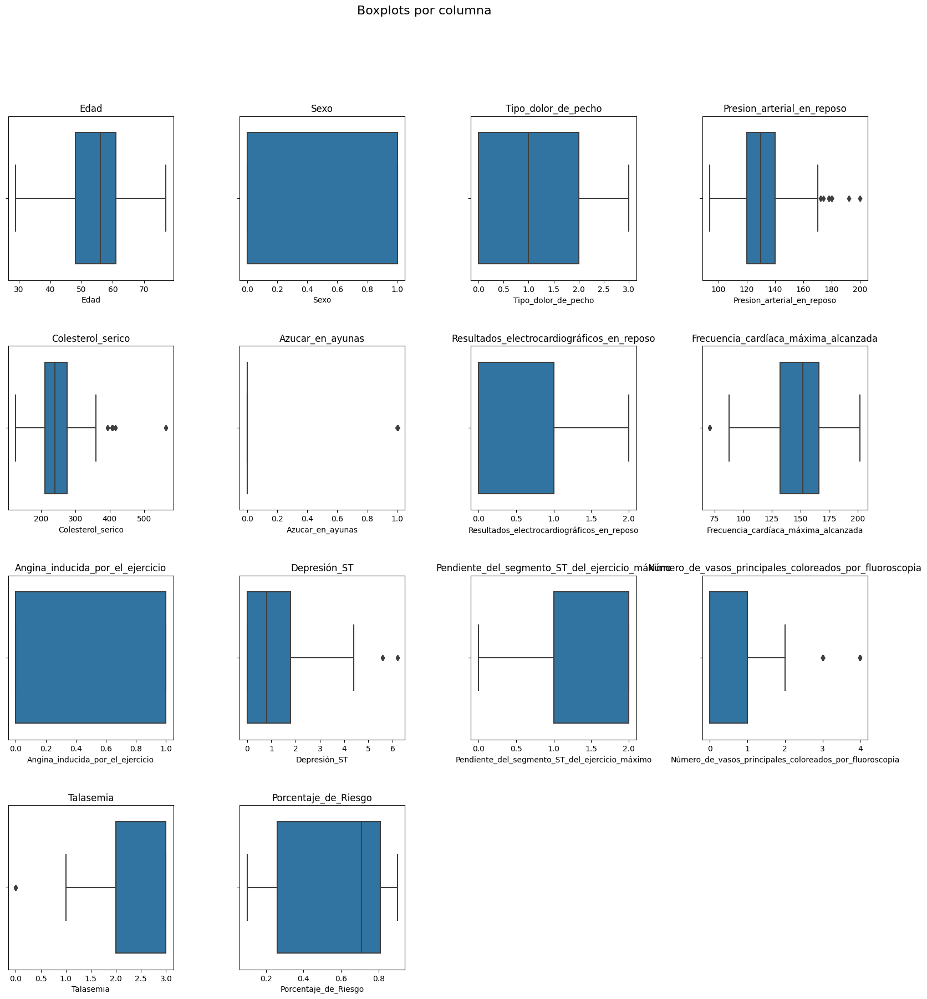

In [12]:
# Obtén el número de columnas en tu DataFrame
num_cols = len(df.columns)

# Calcula el número de filas y columnas necesarias para el mosaico
num_rows = (num_cols + 3) // 4  # División entera hacia arriba

# Crea una figura y ejes para el mosaico
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 20))

# Ajusta el espaciado entre los subgráficos
plt.subplots_adjust(wspace=0.4, hspace=0.4)

# Itera sobre cada columna y crea un boxplot en el subgráfico correspondiente
for i in range(num_cols):
    row = i // 4
    col = i % 4
    ax = axes[row, col]
    sns.boxplot(x=df[df.columns[i]], ax=ax, showfliers=True)  # Mostrar valores atípicos
    ax.set_title(df.columns[i])

# Elimina los subgráficos no utilizados si hay un número impar de columnas
if num_cols % 4 != 0:
    for i in range(num_cols % 4, 4):
        fig.delaxes(axes[-1, i])

# Añade un título al conjunto de boxplots
plt.suptitle("Boxplots por columna", fontsize=16)

# Muestra el mosaico de boxplots
plt.show()

In [13]:
# Calcula el rango intercuartílico de todas las columnas
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Calcula el Score de Rango Intercuartílico para cada valor en cada columna
score_IQR = ((df - Q3) > 1.5 * IQR) | ((df - Q1) < -1.5 * IQR)

# Muestra el resultado
print("Score de Rango Intercuartílico de todas las columnas:")
print(score_IQR)


Score de Rango Intercuartílico de todas las columnas:
       Edad   Sexo  Tipo_dolor_de_pecho  Presion_arterial_en_reposo   
0     False  False                False                       False  \
1     False  False                False                       False   
2     False  False                False                       False   
3     False  False                False                       False   
4     False  False                False                       False   
...     ...    ...                  ...                         ...   
1020  False  False                False                       False   
1021  False  False                False                       False   
1022  False  False                False                       False   
1023  False  False                False                       False   
1024  False  False                False                       False   

      Colesterol_serico  Azucar_en_ayunas   
0                 False             False  \
1  

<div class="alert alert-block alert-success">
  <b>Cada celda en el DataFrame muestra False si el valor correspondiente no se considera atípico según el Score de Rango Intercuartílico y True si se considera atípico.</b> 
</div>

In [14]:
# Conteo de True y False por columnas
count_true = score_IQR.sum()
count_false = score_IQR.count() - count_true

print("\nConteo de valores True por columnas:")
print(count_true)
print("\nConteo de valores False por columnas:")
print(count_false)



Conteo de valores True por columnas:
Edad                                                         0
Sexo                                                         0
Tipo_dolor_de_pecho                                          0
Presion_arterial_en_reposo                                  30
Colesterol_serico                                           16
Azucar_en_ayunas                                           153
Resultados_electrocardiográficos_en_reposo                   0
Frecuencia_cardíaca_máxima_alcanzada                         4
Angina_inducida_por_el_ejercicio                             0
Depresión_ST                                                 7
Pendiente_del_segmento_ST_del_ejercicio_máximo               0
Número_de_vasos_principales_coloreados_por_fluoroscopia     87
Talasemia                                                    7
Porcentaje_de_Riesgo                                         0
dtype: int64

Conteo de valores False por columnas:
Edad                        

<div class="alert alert-block alert-success">
  <b>En la columna "Edad", "Sexo", "Tipo_dolor_de_pecho", "Resultados_electrocardiográficos_en_reposo", "Angina_inducida_por_el_ejercicio" y "Porcentaje_de_Riesgo", no hay valores True, lo que significa que ningún valor excede el umbral establecido por el Score de Rango Intercuartílico.
En otras columnas como "Presion_arterial_en_reposo", "Colesterol_serico", "Frecuencia_cardíaca_máxima_alcanzada", "Depresión_ST", "Número_de_vasos_principales_coloreados_por_fluoroscopia" y "Talasemia", hay valores True, lo que indica que estos valores son considerados atípicos según el Score de Rango Intercuartílico.
La columna "Azucar_en_ayunas" tiene un gran número de valores True (153), lo que sugiere que muchos de los valores son considerados atípicos según el Score de Rango Intercuartílico.
Las columnas con conteos más altos de valores False son "Azucar_en_ayunas", "Número_de_vasos_principales_coloreados_por_fluoroscopia" y "Presion_arterial_en_reposo", lo que sugiere que la mayoría de los valores en estas columnas se consideran típicos según el Score de Rango Intercuartílico.</b> 
</div>

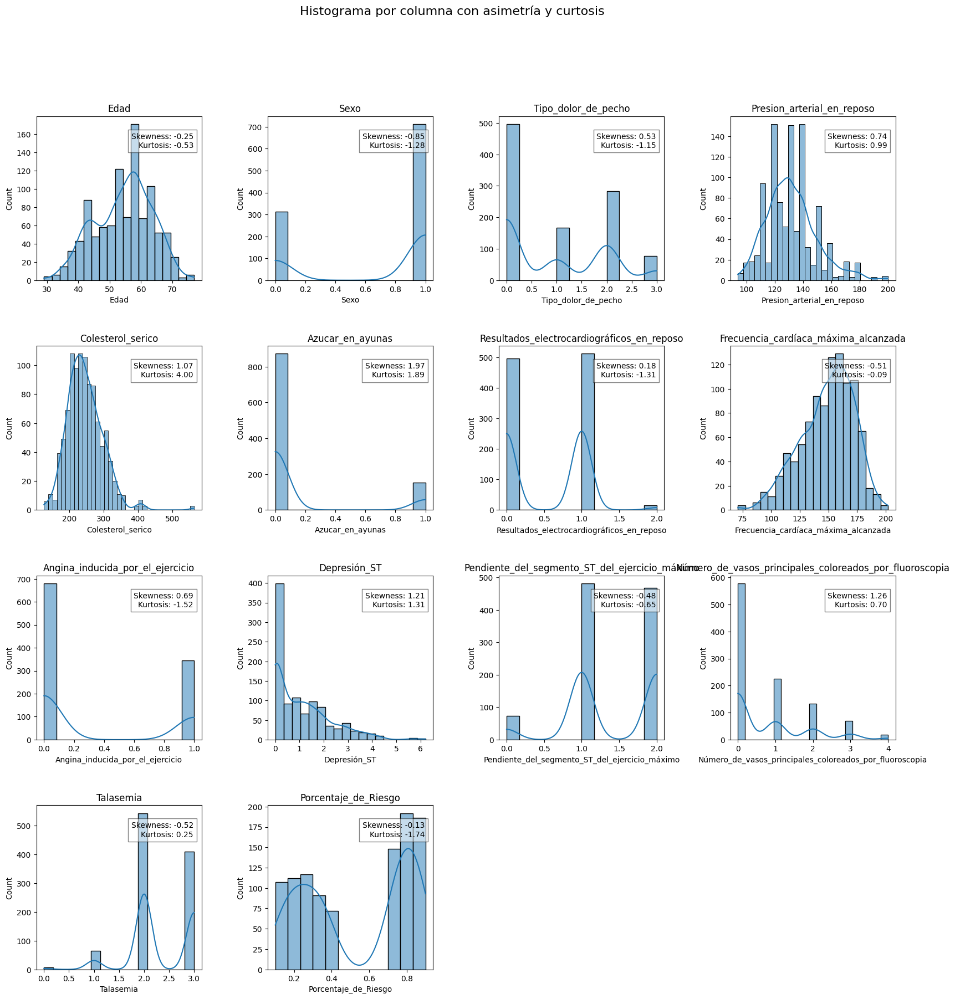

In [15]:
# Obtén el número de columnas en tu DataFrame
num_cols = len(df.columns)

# Calcula el número de filas y columnas necesarias para el mosaico
num_rows = (num_cols + 3) // 4  # División entera hacia arriba

# Crea una figura y ejes para el mosaico de histogramas
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 20))

# Ajusta el espaciado entre los subgráficos
plt.subplots_adjust(wspace=0.4, hspace=0.4)

# Itera sobre cada columna y crea un histograma en el subgráfico correspondiente
for i in range(num_cols):
    row = i // 4
    col = i % 4
    ax = axes[row, col]
    sns.histplot(df[df.columns[i]], kde=True, ax=ax)  # Agrega una línea de densidad (KDE)
    ax.set_title(df.columns[i])
    
    # Calcula y agrega información sobre asimetría y curtosis
    skewness = df[df.columns[i]].skew()
    kurtosis = df[df.columns[i]].kurtosis()
    ax.text(0.95, 0.9, f'Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}', 
            horizontalalignment='right', verticalalignment='top', 
            transform=ax.transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

# Elimina los subgráficos no utilizados si hay un número impar de columnas
if num_cols % 4 != 0:
    for i in range(num_cols % 4, 4):
        fig.delaxes(axes[-1, i])

# Añade un título al conjunto de histogramas
plt.suptitle("Histograma por columna con asimetría y curtosis", fontsize=16)

# Muestra el mosaico de histogramas
plt.show()

In [16]:
# Calcula la asimetría y la curtosis de cada columna
skewness = df.skew()
kurtosis = df.kurtosis()

# Imprime la asimetría y la curtosis de cada columna
for col in df.columns:
    print(f"Columna: {col}")
    print(f"Asimetría: {skewness[col]:.2f}")
    print(f"Curtosis: {kurtosis[col]:.2f}")
    print()

Columna: Edad
Asimetría: -0.25
Curtosis: -0.53

Columna: Sexo
Asimetría: -0.85
Curtosis: -1.28

Columna: Tipo_dolor_de_pecho
Asimetría: 0.53
Curtosis: -1.15

Columna: Presion_arterial_en_reposo
Asimetría: 0.74
Curtosis: 0.99

Columna: Colesterol_serico
Asimetría: 1.07
Curtosis: 4.00

Columna: Azucar_en_ayunas
Asimetría: 1.97
Curtosis: 1.89

Columna: Resultados_electrocardiográficos_en_reposo
Asimetría: 0.18
Curtosis: -1.31

Columna: Frecuencia_cardíaca_máxima_alcanzada
Asimetría: -0.51
Curtosis: -0.09

Columna: Angina_inducida_por_el_ejercicio
Asimetría: 0.69
Curtosis: -1.52

Columna: Depresión_ST
Asimetría: 1.21
Curtosis: 1.31

Columna: Pendiente_del_segmento_ST_del_ejercicio_máximo
Asimetría: -0.48
Curtosis: -0.65

Columna: Número_de_vasos_principales_coloreados_por_fluoroscopia
Asimetría: 1.26
Curtosis: 0.70

Columna: Talasemia
Asimetría: -0.52
Curtosis: 0.25

Columna: Porcentaje_de_Riesgo
Asimetría: -0.13
Curtosis: -1.74



| Columna                                                     | Asimetría | Curtosis | Explicación                                                                                                        |
|-------------------------------------------------------------|------------|----------|--------------------------------------------------------------------------------------------------------------------|
| Edad                                                        | -0.25      | -0.53    | Para la columna de edad, la asimetría es ligeramente negativa, lo que indica una falta de simetría hacia la izquierda. La curtosis es negativa, lo que sugiere que la distribución es relativamente menos picuda que una distribución normal. |
| Sexo                                                        | -0.85      | -1.28    | En la columna de sexo, la asimetría es negativa, lo que sugiere una falta de simetría hacia la izquierda. La curtosis también es negativa, indicando una distribución relativamente menos picuda que una distribución normal. |
| Tipo_dolor_de_pecho                                         | 0.53       | -1.15    | Para la columna de tipo de dolor de pecho, la asimetría es positiva, lo que sugiere una falta de simetría hacia la derecha. La curtosis es negativa, indicando una distribución relativamente menos picuda que una distribución normal. |
| Presion_arterial_en_reposo                                  | 0.74       | 0.99     | En la columna de presión arterial en reposo, la asimetría es positiva, lo que indica una falta de simetría hacia la derecha. La curtosis es positiva, lo que sugiere una distribución más picuda que una distribución normal. |
| Colesterol_serico                                           | 1.07       | 4.00     | Para la columna de colesterol sérico, la asimetría y la curtosis son positivas, indicando una distribución sesgada a la derecha y una distribución más picuda que una distribución normal. |
| Azucar_en_ayunas                                            | 1.97       | 1.89     | En la columna de azúcar en ayunas, tanto la asimetría como la curtosis son positivas, lo que sugiere una distribución sesgada a la derecha y una distribución más picuda que una distribución normal. |
| Resultados_electrocardiográficos_en_reposo                  | 0.18       | -1.31    | Para la columna de resultados electrocardiográficos en reposo, la asimetría es cercana a cero, lo que sugiere una distribución relativamente simétrica. La curtosis es negativa, indicando una distribución menos picuda que una distribución normal. |
| Frecuencia_cardíaca_máxima_alcanzada                        | -0.51      | -0.09    | En la columna de frecuencia cardíaca máxima alcanzada, la asimetría es negativa, lo que indica una falta de simetría hacia la izquierda. La curtosis es cercana a cero, lo que sugiere una distribución relativamente similar a una distribución normal. |
| Angina_inducida_por_el_ejercicio                            | 0.69       | -1.52    | Para la columna de angina inducida por el ejercicio, la asimetría es positiva, lo que sugiere una falta de simetría hacia la derecha. La curtosis es negativa, indicando una distribución relativamente menos picuda que una distribución normal. |
| Depresión_ST                                                | 1.21       | 1.31     | En la columna de depresión del segmento ST, tanto la asimetría como la curtosis son positivas, indicando una distribución sesgada a la derecha y una distribución más picuda que una distribución normal. |
| Pendiente_del_segmento_ST_del_ejercicio_máximo              | -0.48      | -0.65    | Para la columna de pendiente del segmento ST del ejercicio máximo, tanto la asimetría como la curtosis son negativas, sugiriendo una falta de simetría hacia la izquierda y una distribución menos picuda que una distribución normal. |
| Número_de_vasos_principales_coloreados_por_fluoroscopia     | 1.26       | 0.70     | En la columna del número de vasos principales coloreados por fluoroscopia, tanto la asimetría como la curtosis son positivas, lo que sugiere una distribución sesgada a la derecha y una distribución más picuda que una distribución normal. |
| Talasemia                                                   | -0.52      | 0.25     | Para la columna de talasemia, la asimetría es negativa, lo que sugiere una falta de simetría hacia la izquierda. La curtosis es positiva, indicando una distribución más picuda que una distribución normal. |
| Porcentaje_de_Riesgo                                        | -0.13      | -1.74    | En la columna de porcentaje de riesgo, la asimetría es negativa, lo que sugiere una falta de simetría hacia la izquierda. La curtosis es negativa, indicando una distribución menos picuda que una distribución normal. |


<h2>Exploracion de variables categoricas y analisis multivariable</h2>

In [17]:
# Iterar sobre todas las columnas de tipo entero
for column in df.select_dtypes(include='int64').columns:
    print(f"Columna: {column}")
    print("Frecuencia de cada valor:")
    print(df[column].value_counts())
    print("Moda:")
    print(df[column].mode())
    print()


Columna: Edad
Frecuencia de cada valor:
Edad
58    68
57    57
54    53
59    46
52    43
51    39
56    39
62    37
60    37
44    36
64    34
41    32
63    32
67    31
61    31
55    30
65    27
43    26
42    26
53    26
66    25
45    25
48    23
46    23
50    21
47    18
49    17
35    15
39    14
70    14
68    12
38    12
71    11
40    11
69     9
37     6
34     6
29     4
76     3
77     3
74     3
Name: count, dtype: int64
Moda:
0    58
Name: Edad, dtype: int64

Columna: Sexo
Frecuencia de cada valor:
Sexo
1    713
0    312
Name: count, dtype: int64
Moda:
0    1
Name: Sexo, dtype: int64

Columna: Tipo_dolor_de_pecho
Frecuencia de cada valor:
Tipo_dolor_de_pecho
0    497
2    284
1    167
3     77
Name: count, dtype: int64
Moda:
0    0
Name: Tipo_dolor_de_pecho, dtype: int64

Columna: Presion_arterial_en_reposo
Frecuencia de cada valor:
Presion_arterial_en_reposo
120    128
130    123
140    107
110     64
150     55
138     45
128     39
125     38
160     36
112     30
13

| Columna                                   | Frecuencia de cada valor                                                                                       | Moda                                                  |
|-------------------------------------------|---------------------------------------------------------------------------------------------------------------|-------------------------------------------------------|
| Edad                                      | - La edad más común en tu conjunto de datos es 58, con 68 ocurrencias.                                           | - La moda (valor más frecuente) de la columna Edad es 58.  |
| Sexo                                      | - Hay 713 registros con el valor 1 (presumiblemente masculino) y 312 registros con el valor 0 (presumiblemente femenino). | - El valor más común en la columna Sexo es 1 (presumiblemente masculino). |
| Tipo_dolor_de_pecho                      | - La mayoría de los registros (497) tienen el tipo de dolor de pecho codificado como 0.                          | - El tipo de dolor de pecho más común es el código 0.     |
| Presion_arterial_en_reposo               | - La presión arterial en reposo más común es 120, con 128 ocurrencias.                                           | - La moda de la columna Presion_arterial_en_reposo es 120.  |
| Colesterol_serico                        | - Los valores más comunes para el colesterol sérico son 204 y 234, ambos con 21 ocurrencias.                      | - Las modas de la columna Colesterol_serico son 204 y 234. |
| Azucar_en_ayunas                         | - Hay 872 registros con el valor 0 (presumiblemente no hay azúcar en ayunas) y 153 registros con el valor 1 (presumiblemente hay azúcar en ayunas). | - La moda de la columna Azucar_en_ayunas es 0. |
| Resultados_electrocardiográficos_en_reposo | - La mayoría de los registros (513) tienen el resultado del electrocardiograma en reposo codificado como 1. | - La moda de la columna Resultados_electrocardiográficos_en_reposo es 1. |
| Frecuencia_cardíaca_máxima_alcanzada       | - La frecuencia cardíaca máxima más común es 162, con 35 ocurrencias.                                           | - La moda de la columna Frecuencia_cardíaca_máxima_alcanzada es 162. |
| Angina_inducida_por_el_ejercicio           | - Hay 680 registros con el valor 0 (presumiblemente no hay angina inducida por el ejercicio) y 345 registros con el valor 1 (presumiblemente hay angina inducida por el ejercicio). | - La moda de la columna Angina_inducida_por_el_ejercicio es 0. |
| Pendiente_del_segmento_ST_del_ejercicio_máximo | - La mayoría de los registros (482) tienen la pendiente del segmento ST del ejercicio máximo codificado como 1. | - La moda de la columna Pendiente_del_segmento_ST_del_ejercicio_máximo es 1. |
| Número_de_vasos_principales_coloreados_por_fluoroscopia | - La mayoría de los registros (578) tienen 0 vasos principales coloreados por fluoroscopia.                 | - La moda de la columna Número_de_vasos_principales_coloreados_por_fluoroscopia es 0. |
| Talasemia                                 | - Hay 544 registros con el valor 2, 410 registros con el valor 3, 64 registros con el valor 1 y 7 registros con el valor 0. | - La moda de la columna Talasemia es 2. |


In [18]:
# Generar tablas de contingencia para todas las columnas enteras
contingency_tables = {}

# Obtener una lista de todas las columnas enteras
int_columns = df.select_dtypes(include='int64').columns.tolist()

# Iterar sobre cada columna entera
for i, col1 in enumerate(int_columns):
    # Generar tablas de contingencia solo con las columnas restantes
    for col2 in int_columns[i+1:]:
        contingency_table = pd.crosstab(df[col1], df[col2])
        contingency_tables[(col1, col2)] = contingency_table

# Imprimir las tablas de contingencia
for cols, table in contingency_tables.items():
    print(f"Tabla de contingencia para {cols}:")
    print(table)
    print()

Tabla de contingencia para ('Edad', 'Sexo'):
Sexo   0   1
Edad        
29     0   4
34     3   3
35     4  11
37     3   3
38     0  12
39     7   7
40     0  11
41    12  20
42     6  20
43     7  19
44     6  30
45    10  15
46     9  14
47     0  18
48     3  20
49     6  11
50     9  12
51    12  27
52     3  40
53     9  17
54    15  38
55    15  15
56    10  29
57    12  45
58    21  47
59     3  43
60    13  24
61     8  23
62    24  13
63    17  15
64     9  25
65    13  14
66    11  14
67     9  22
68     3   9
69     3   6
70     0  14
71    11   0
74     3   0
76     3   0
77     0   3

Tabla de contingencia para ('Edad', 'Tipo_dolor_de_pecho'):
Tipo_dolor_de_pecho   0   1   2   3
Edad                               
29                    0   4   0   0
34                    0   3   0   3
35                   11   4   0   0
37                    0   0   6   0
38                    0   0   8   4
39                    4   0  10   0
40                    8   0   0   3
41         

<div class="alert alert-block alert-success">
  <b>Las tablas de contingencia muestran la relación entre dos variables categóricas al contar la frecuencia de ocurrencia de cada combinación de categorías. Por ejemplo, en la tabla de contingencia para ('Edad', 'Sexo'), cada celda muestra cuántos individuos hay para una combinación específica de edad y sexo. Esto permite analizar cómo se distribuyen ciertas características (como la edad y el sexo) dentro del conjunto de datos y si hay alguna relación entre ellas.</b> 
</div>

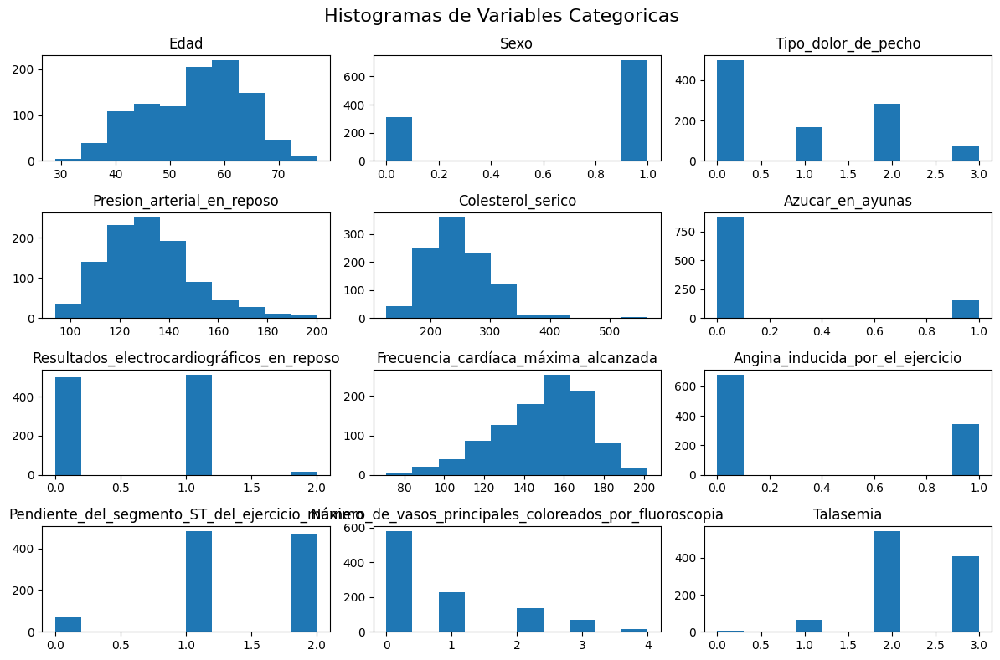

In [19]:
# Crear subplots
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(12, 8))

# Variables enteras
int_columns = df.select_dtypes(include='int64').columns

# Iterar sobre las columnas enteras y crear un gráfico para cada una
for i, ax in enumerate(axs.flat):
    col = int_columns[i]
    ax.hist(df[col])
    ax.set_title(col)
    
# Título general de la figura
fig.suptitle('Histogramas de Variables Categoricas', fontsize=16)

# Ajustar el diseño y mostrar la gráfica
plt.tight_layout()
plt.show()

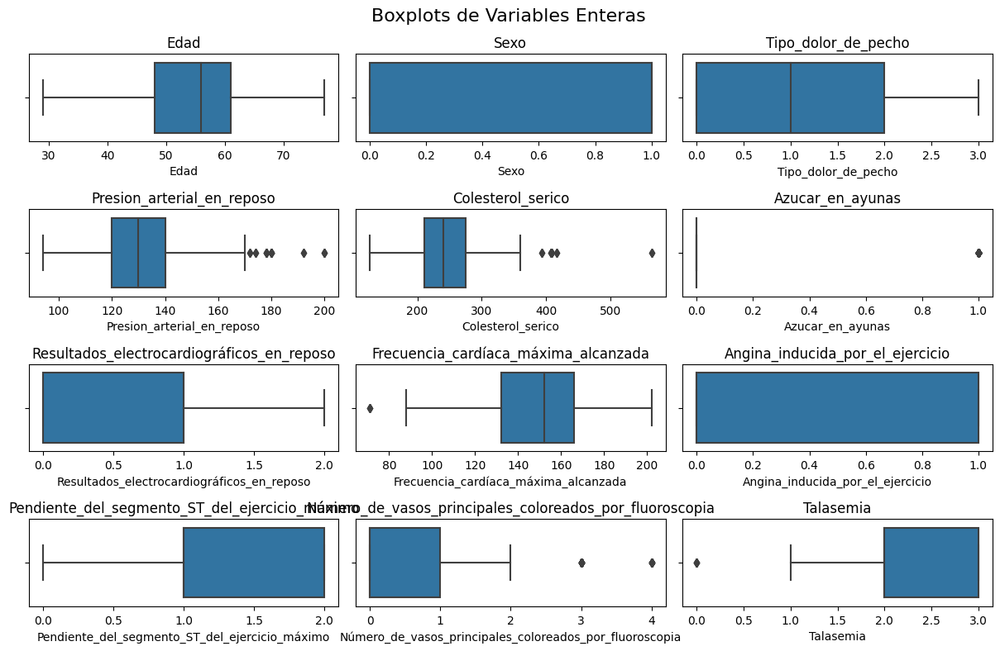

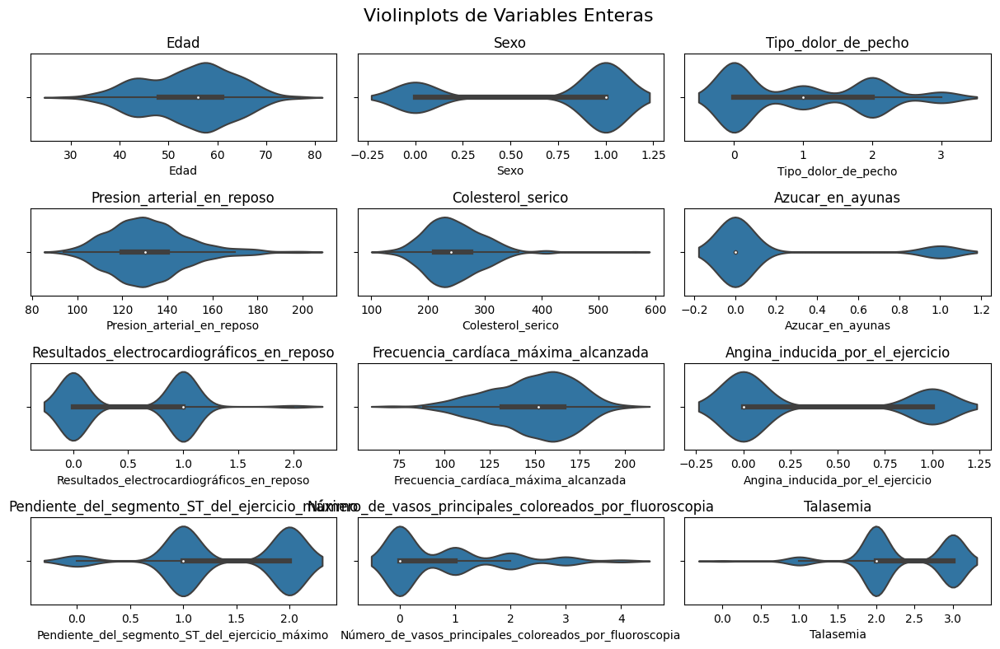

In [20]:
# Crear subplots para boxplots
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(12, 8))

# Variables enteras
int_columns = df.select_dtypes(include='int64').columns

# Iterar sobre las columnas enteras y crear un boxplot para cada una
for i, ax in enumerate(axs.flat):
    col = int_columns[i]
    sns.boxplot(x=df[col], ax=ax)
    ax.set_title(col)

# Título general de la figura
fig.suptitle('Boxplots de Variables Enteras', fontsize=16)

# Ajustar el diseño y mostrar la gráfica
plt.tight_layout()
plt.show()

# Crear subplots para violinplots
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(12, 8))

# Iterar sobre las columnas enteras y crear un violinplot para cada una
for i, ax in enumerate(axs.flat):
    col = int_columns[i]
    sns.violinplot(x=df[col], ax=ax)
    ax.set_title(col)

# Título general de la figura
fig.suptitle('Violinplots de Variables Enteras', fontsize=16)

# Ajustar el diseño y mostrar la gráfica
plt.tight_layout()
plt.show()


<h2>Correlaciones y regresion Linear Simple</h2>

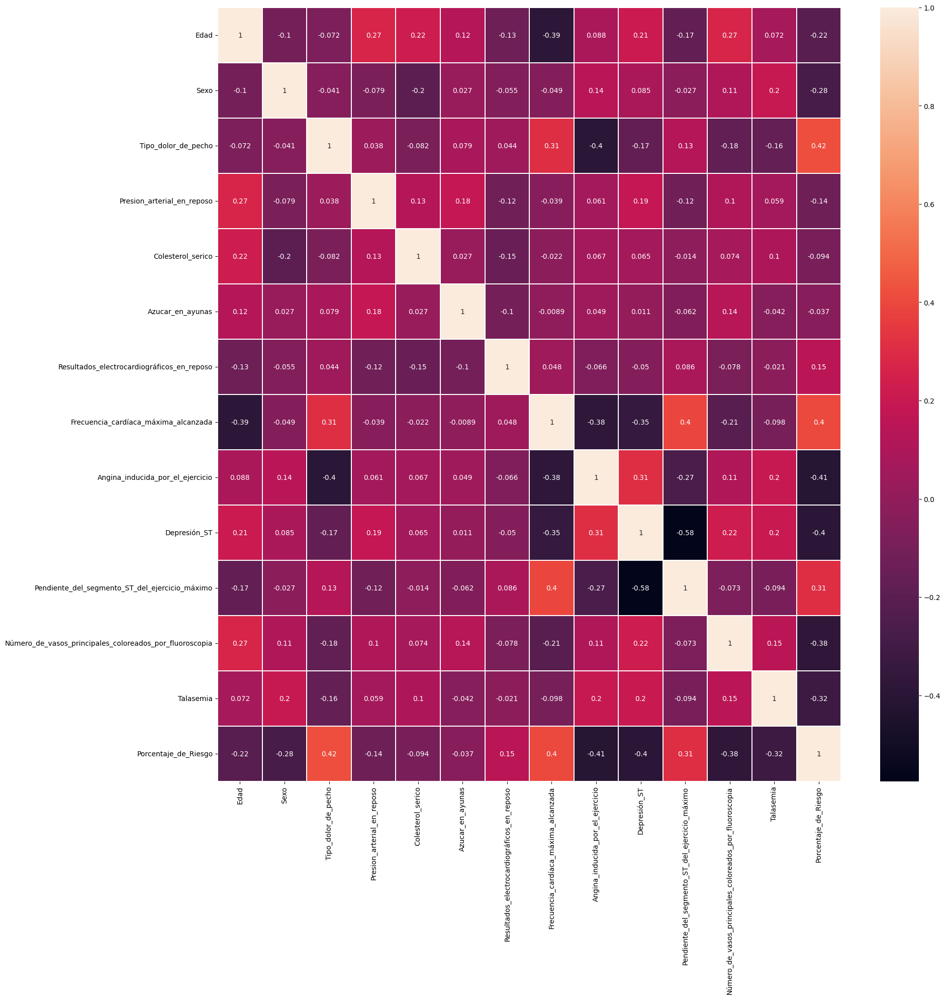

In [21]:
# Data Visualizations

f, ax = plt.subplots(figsize=(20,20))
sns.heatmap(df.corr(),annot=True, linewidths=.1, ax=ax)
plt.show()

In [22]:
# Calcular la correlación de cada característica con la variable objetivo
correlations = abs(df.corr()['Porcentaje_de_Riesgo'].drop('Porcentaje_de_Riesgo') )

# Ordenar las características por su correlación con la variable objetivo
sorted_features = correlations.sort_values(ascending=False)

print(sorted_features)

Tipo_dolor_de_pecho                                        0.415776
Angina_inducida_por_el_ejercicio                           0.413340
Frecuencia_cardíaca_máxima_alcanzada                       0.399374
Depresión_ST                                               0.396015
Número_de_vasos_principales_coloreados_por_fluoroscopia    0.377432
Talasemia                                                  0.318412
Pendiente_del_segmento_ST_del_ejercicio_máximo             0.309702
Sexo                                                       0.276350
Edad                                                       0.215906
Resultados_electrocardiográficos_en_reposo                 0.148220
Presion_arterial_en_reposo                                 0.135662
Colesterol_serico                                          0.093788
Azucar_en_ayunas                                           0.037065
Name: Porcentaje_de_Riesgo, dtype: float64


<div class="alert alert-block alert-warning">
  <b>-Tipo de dolor de pecho y Angina inducida por el ejercicio (0.415776):
Existe una correlación moderadamente positiva entre el tipo de dolor de pecho y la angina inducida por el ejercicio. Esto sugiere que las personas con ciertos tipos de dolor de pecho tienden a experimentar angina cuando hacen ejercicio.


-Frecuencia cardíaca máxima alcanzada y Depresión ST (0.399374 y 0.396015, respectivamente):
Hay una correlación moderadamente positiva entre la frecuencia cardíaca máxima alcanzada y la depresión del segmento ST. Esto puede indicar que a medida que la frecuencia cardíaca máxima aumenta, también lo hace la depresión del segmento ST en el electrocardiograma.


-Número de vasos principales coloreados por fluoroscopia y Talasemia (0.377432 y 0.318412, respectivamente):
Existe una correlación positiva moderada entre el número de vasos principales coloreados por fluoroscopia y la talasemia. Esto sugiere que puede haber una asociación entre el número de vasos coloreados por fluoroscopia y la presencia de talasemia en los pacientes.


-Pendiente del segmento ST del ejercicio máximo y Sexo (0.309702 y 0.276350, respectivamente):
Hay una correlación positiva moderada entre la pendiente del segmento ST del ejercicio máximo y el sexo. Esto puede indicar que hay diferencias en la pendiente del segmento ST entre hombres y mujeres durante el ejercicio máximo.


-Edad y Resultados electrocardiográficos en reposo (0.215906 y 0.148220, respectivamente):
Existe una correlación débil positiva entre la edad y los resultados electrocardiográficos en reposo. Esto puede sugerir que a medida que aumenta la edad, también tienden a cambiar los resultados electrocardiográficos en reposo.


-Presión arterial en reposo, Colesterol sérico y Azúcar en ayunas (0.135662, 0.093788 y 0.037065, respectivamente):
Estas correlaciones son débiles y sugieren una relación menos clara entre estas variables. Es posible que haya otros factores que influyan en la presión arterial, el colesterol sérico y el azúcar en ayunas, que no están capturados por estas correlaciones.</b>
</div>

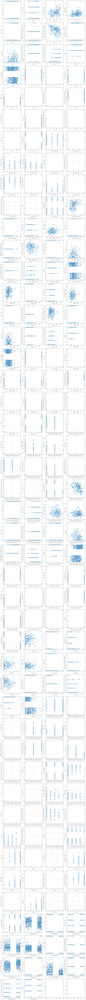

In [23]:
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Obtener el número de variables numéricas
num_vars = len(numeric_columns)

# Crear lista para almacenar las combinaciones válidas
valid_combinations = []

# Identificar combinaciones válidas
for i, var1 in enumerate(numeric_columns):
    for j, var2 in enumerate(numeric_columns):
        if i != j:  # Evitar crear scatterplot de una variable consigo misma
            valid_combinations.append((var1, var2))

# Obtener el número de combinaciones válidas
num_combinations = len(valid_combinations)

# Calcular el número de filas y columnas para el subplot
num_cols = 4  # Define el número de columnas deseado
num_rows = (num_combinations + num_cols - 1) // num_cols

# Calcular el tamaño de la figura
fig_width = 4 * num_cols
fig_height = 4 * num_rows

# Crear subplots con el número correcto de filas y columnas
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(fig_width, fig_height))

# Iterar sobre cada combinación de variables y crear scatterplots
for idx, (var1, var2) in enumerate(valid_combinations):
    row = idx // num_cols
    col = idx % num_cols
    sns.scatterplot(data=df, x=var1, y=var2, ax=axes[row, col])
    axes[row, col].tick_params(labelsize=8)  # Tamaño de la letra más pequeño
    axes[row, col].set_xlabel(var1, fontsize=8)  # Tamaño de la letra más pequeño
    axes[row, col].set_ylabel(var2, fontsize=8)  # Tamaño de la letra más pequeño

# Ajustar automáticamente los espacios entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

<div class="alert alert-block alert-warning">
  <b>Los scatterplots nos permiten ver cómo dos variables numéricas se relacionan entre sí. Al observar el gráfico, podemos notar si los puntos están agrupados en una dirección particular, como hacia arriba y hacia la derecha, lo que sugiere una relación positiva, o hacia abajo y hacia la derecha, indicando una relación negativa. Si los puntos están dispersos sin un patrón claro, esto sugiere que no hay una relación lineal entre las variables.

La fuerza de la relación se puede inferir observando qué tan cerca están los puntos de una línea o curva imaginaria trazada a través de ellos. Cuanto más cerca estén los puntos de esta línea, más fuerte será la relación entre las variables.

Los valores atípicos, que son puntos que se desvían significativamente del patrón general, también se pueden identificar en el scatterplot. Estos valores pueden indicar observaciones inusuales o errores en los datos.</b> 
</div>

<h2>Visualizacion de Datos Avanzada</h2>

In [24]:
# Obtener las columnas enteras
int_columns = df.select_dtypes(include='int64').columns

# Crear una lista para almacenar todos los boxplots
data = []

# Iterar sobre cada columna y agregar un boxplot a la lista
for col in int_columns:
    boxplot = go.Box(y=df[col], name=col, boxpoints='all')
    data.append(boxplot)

# Crear el diseño de la figura
layout = go.Layout(
    title='Boxplots de Variables Enteras',
    height=700,
    width=900,
    boxmode='group',  # Organiza los boxplots en grupos
)

# Crear la figura
fig = go.Figure(data=data, layout=layout)

# Mostrar la figura
fig.show()

In [25]:
# Obtener las columnas enteras
int_columns = df.select_dtypes(include='int64').columns

# Crear una lista para almacenar todos los violinplots
data = []

# Iterar sobre cada columna y agregar un violinplot a la lista
for col in int_columns:
    violinplot = go.Violin(y=df[col], name=col, box_visible=True, meanline_visible=True)
    data.append(violinplot)

# Crear el diseño de la figura
layout = go.Layout(
    title='Violinplots de Variables Enteras',
    height=700,
    width=900,
    violingap=0  # No dejar espacio entre los violines
)

# Crear la figura
fig = go.Figure(data=data, layout=layout)

# Mostrar la figura
fig.show()

In [26]:
# Obtener las columnas enteras
int_columns = df.select_dtypes(include='int64').columns

# Calcular el número total de subplots
num_subplots = len(int_columns)

# Crear un mosaico de subplots para los histogramas
fig = make_subplots(rows=num_subplots, cols=1, subplot_titles=int_columns, vertical_spacing=0.05)

# Iterar sobre cada columna y agregar un histograma a un subplot
for i, col in enumerate(int_columns, start=1):
    fig.add_trace(go.Histogram(x=df[col], name=col), row=i, col=1)

# Actualizar el diseño de la figura
fig.update_layout(
    title='Histogramas de Variables Enteras',
    height=1500,  # Ajusta el alto para acomodar todos los subplots
    width=800
)

# Mostrar la figura
fig.show()

In [27]:
# Calcular la matriz de correlación
correlation_matrix = df.corr()

# Crear figura
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.columns,
    colorscale='RdBu',  # Cambiar a la paleta de colores deseada
    hoverongaps=False,
    zmin=-1,  # Mínimo valor de correlación
    zmax=1,   # Máximo valor de correlación
    colorbar=dict(
        title='Correlación',  # Título de la barra de colores
        tickvals=[-1, 0, 1],   # Valores de la barra de colores
        ticktext=['-1', '0', '1'],  # Etiquetas de los valores de la barra de colores
    )
))

# Ajustar la apariencia del heatmap
fig.update_layout(
    title='Matriz de Correlación',
    xaxis=dict(title='Variables', showticklabels=True),
    yaxis=dict(title='Variables', showticklabels=True),
    autosize=False,
    width=800,
    height=800,
    font=dict(size=10),  # Tamaño de la fuente
)

# Mostrar el gráfico interactivo
fig.show()

In [28]:
scaler = MinMaxScaler() 

df['Edad'] = scaler.fit_transform(df[['Edad']])
df['Sexo'] = scaler.fit_transform(df[['Sexo']])
df['Tipo_dolor_de_pecho'] = scaler.fit_transform(df[['Tipo_dolor_de_pecho']])
df['Presion_arterial_en_reposo'] = scaler.fit_transform(df[['Presion_arterial_en_reposo']])
df['Colesterol_serico'] = scaler.fit_transform(df[['Colesterol_serico']])
df['Azucar_en_ayunas'] = scaler.fit_transform(df[['Azucar_en_ayunas']])
df['Resultados_electrocardiográficos_en_reposo'] = scaler.fit_transform(df[['Resultados_electrocardiográficos_en_reposo']])
df['Frecuencia_cardíaca_máxima_alcanzada'] = scaler.fit_transform(df[['Frecuencia_cardíaca_máxima_alcanzada']])
df['Angina_inducida_por_el_ejercicio'] = scaler.fit_transform(df[['Angina_inducida_por_el_ejercicio']])
df['Depresión_ST'] = scaler.fit_transform(df[['Depresión_ST']])
df['Pendiente_del_segmento_ST_del_ejercicio_máximo'] = scaler.fit_transform(df[['Pendiente_del_segmento_ST_del_ejercicio_máximo']])
df['Número_de_vasos_principales_coloreados_por_fluoroscopia'] = scaler.fit_transform(df[['Número_de_vasos_principales_coloreados_por_fluoroscopia']])
df['Talasemia'] = scaler.fit_transform(df[['Talasemia']])

<div class="alert alert-block alert-warning">
  <b>Escalar los datos es una práctica importante en el preprocesamiento de datos para mejorar el rendimiento y la estabilidad de los modelos de aprendizaje automático</b> 
</div>

In [29]:
X=df.iloc[:,[2,8,7,9,11,12,10]]
y=df['Porcentaje_de_Riesgo']

In [30]:
# División de los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Inicialización del modelo de regresión lineal
model = LinearRegression()

# Entrenamiento del modelo
model.fit(X_train, y_train)

# Predicción en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluación del rendimiento del modelo
r2 = r2_score(y_test, y_pred)
print("Coeficiente de determinación (R cuadrado):", r2)

# Interpretación de los coeficientes de la regresión
print("Coeficientes de la regresión:", model.coef_)

# Validación cruzada
cv_scores = cross_val_score(model, X, y, cv=5)
print("Puntajes de validación cruzada:", cv_scores)
print("Puntaje de validación cruzada promedio:", np.mean(cv_scores))

Coeficiente de determinación (R cuadrado): 0.2715416579024038
Coeficientes de la regresión: [ 0.17756388 -0.0846051   0.21671271 -0.24087456 -0.27239225 -0.28381148
  0.07972735]
Puntajes de validación cruzada: [0.47829962 0.46670137 0.45962628 0.34566436 0.31640213]
Puntaje de validación cruzada promedio: 0.4133387510985429


<div class="alert alert-block alert-warning">
  <b>El coeficiente de determinación (R cuadrado) indica que el modelo explica alrededor del 27.15% de la variabilidad de los datos. Los coeficientes de la regresión muestran cómo cada característica afecta la variable objetivo. Los puntajes de validación cruzada, con un promedio de aproximadamente 0.4133, sugieren un rendimiento moderado en la generalización a nuevos datos.</b> 
</div>

In [31]:
# Crear el modelo de árbol de decisión
modelo_arbol = DecisionTreeRegressor()

# Realizar la validación cruzada y calcular los puntajes R cuadrado
puntajes_r2 = cross_val_score(modelo_arbol, X, y, cv=5, scoring='r2')  # Reemplaza X y y con tus datos

# Calcular el puntaje promedio de R cuadrado
r2_promedio = puntajes_r2.mean()

# Imprimir el puntaje promedio de R cuadrado
print("Puntaje de R cuadrado promedio:", r2_promedio)

Puntaje de R cuadrado promedio: 0.8623108841257888


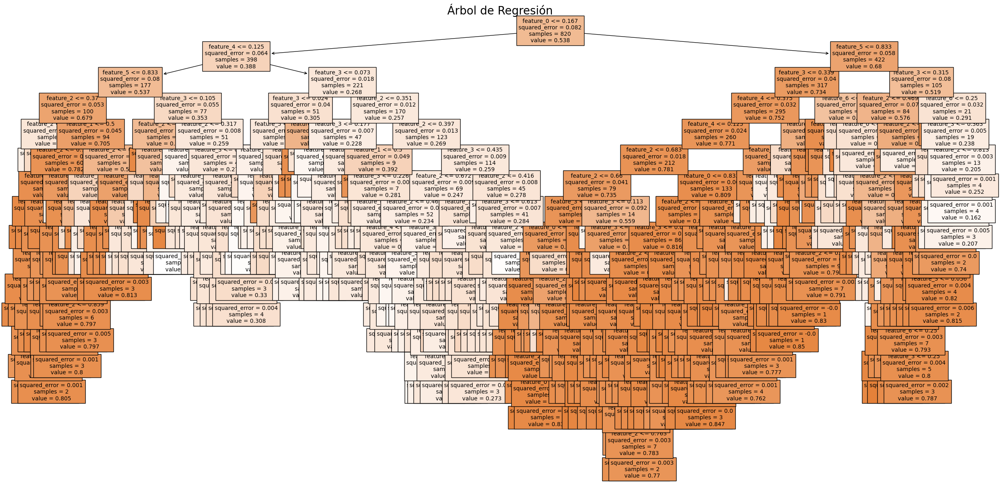

In [32]:
# Crear y ajustar el modelo de árbol de regresión
modelo_arbol = DecisionTreeRegressor(random_state=42)
modelo_arbol.fit(X_train, y_train)

# Visualizar el árbol de regresión con cajas más grandes
plt.figure(figsize=(30, 15))  # Ajustar el tamaño de la figura
plot_tree(modelo_arbol, filled=True, feature_names=[f'feature_{i}' for i in range(X_train.shape[1])], fontsize=10)
plt.title("Árbol de Regresión", fontsize=20)  # Ajustar el tamaño del título
plt.show()


<h2>Pruebas A/B y Procesamiento de lenguaje Natural</h2>


Este ejemplo compara el porcentaje de riesgo entre dos grupos, uno de hombres (Sexo=0) y otro de mujeres (Sexo=1).

In [33]:
# Dividir los datos en dos grupos, por ejemplo, por género
group1 = df[df['Sexo'] == 0]
group2 = df[df['Sexo'] == 1]

# Calcular la métrica de interés para ambos grupos
mean_group1 = group1['Porcentaje_de_Riesgo'].mean()
mean_group2 = group2['Porcentaje_de_Riesgo'].mean()

# Calcular la diferencia en medias observadas
observed_difference = mean_group2 - mean_group1

# Realizar el algoritmo de permutación para evaluar la significancia estadística
all_values = df['Porcentaje_de_Riesgo'].values
num_permutations = 1000
differences = []
for _ in range(num_permutations):
    np.random.shuffle(all_values)
    perm_group1 = all_values[:len(group1)]
    perm_group2 = all_values[len(group1):]
    differences.append(perm_group2.mean() - perm_group1.mean())

# Calcular el valor p (p-value)
p_value = (np.abs(differences) >= np.abs(observed_difference)).mean()

# Imprimir los resultados
print("Diferencia en medias observadas:", observed_difference)
print("Valor p (p-value):", p_value)

Diferencia en medias observadas: -0.17157168159096625
Valor p (p-value): 0.0


<div class="alert alert-block alert-warning">
  <b>La "Diferencia en medias observadas" indica cuánto difieren las medias de las muestras comparadas. En este caso, la diferencia es aproximadamente -0.172, lo que significa que el grupo de mujeres tiende a tener un riesgo ligeramente menor que el grupo de hombres.

El "Valor p" (p-value) es la probabilidad de obtener una diferencia en las medias igual o más extrema que la observada, si no hay diferencia real entre los grupos. Un valor p bajo, como 0.0 en este caso, sugiere que la diferencia es estadísticamente significativa, es decir, poco probable que sea aleatoria.</b> 

Este código buscará números enteros en la columna "Presion_arterial_en_reposo" de tu conjunto de datos y devolverá una lista de todos los números enteros encontrados en cada fila. 

In [34]:
# Define el patrón para encontrar números enteros
pattern = r'\b\d+\b'

# Aplica la expresión regular a la columna "Presion_arterial_en_reposo"
presiones_arteriales = df['Presion_arterial_en_reposo'].astype(str).str.findall(pattern)

# Muestra los resultados
print(presiones_arteriales)

0        [0, 2924528301886792]
1        [0, 4339622641509434]
2       [0, 48113207547169823]
3        [0, 5094339622641509]
4       [0, 41509433962264153]
                 ...          
1020     [0, 4339622641509434]
1021     [0, 2924528301886792]
1022    [0, 15094339622641517]
1023    [0, 15094339622641517]
1024    [0, 24528301886792458]
Name: Presion_arterial_en_reposo, Length: 1025, dtype: object


Este código tokeniza cada valor en todas las columnas numéricas de tu DataFrame y luego calcula la frecuencia de los valores más comunes.

In [35]:
# Tokenización y análisis de frecuencia de palabras en todas las columnas
all_words = []
for col in df.columns:
    if df[col].dtype in [int, float]:  # Solo tokenizar columnas numéricas
        for value in df[col]:
            tokens = word_tokenize(str(value))
            all_words.extend(tokens)

# Calcula la frecuencia de palabras más comunes
fdist = FreqDist(all_words)
print(fdist.most_common(10))

[('0.0', 3864), ('1.0', 2207), ('0.5', 1133), ('0.6666666666666666', 859), ('0.25', 274), ('0.3333333333333333', 231), ('0.24528301886792458', 128), ('0.339622641509434', 123), ('0.4339622641509434', 107), ('0.75', 95)]


<div class="alert alert-block alert-success">
  <b>Estos valores representan los valores numéricos más comunes en tus columnas, junto con la cantidad de veces que aparecen en tus datos.</b> 
</div>

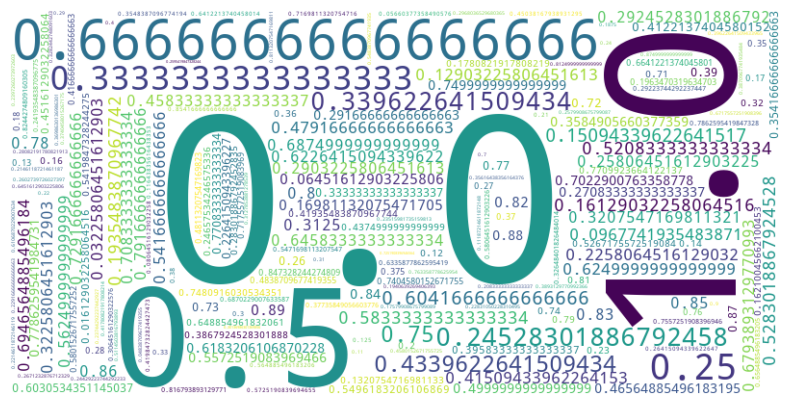

In [36]:
# Convierte cada valor numérico en texto
text_data = df.applymap(str).values.flatten().tolist()

# Cuenta las frecuencias de las palabras
word_freq = Counter(text_data)

# Crea la nube de palabras
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Visualiza la nube de palabras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

<div class="alert alert-block alert-success">
  <b>Este código generará una nube de palabras donde el tamaño de cada palabra será proporcional a su frecuencia en tus datos.</b>
</div>


<h2>Introduccion a Machine Learning: Clasificacion No Supervisada y Supervisada</h2>

<div class="alert alert-block alert-success">
  <b>El dataset se ajusta a un problema de regresion pero puedo ajustarlo simplemente discretizando la variable en 4 categorias</b>
</div>

In [37]:
# Utilizamos qcut para dividir la columna 'y' en 4 categorías (cuartiles)
df['Porcentaje_de_Riesgo'] = pd.qcut(df['Porcentaje_de_Riesgo'], q=4, labels=['Muy bajo', 'Bajo', 'Alto', 'Potencialmente mortal'])

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1025 entries, 0 to 1024
Data columns (total 14 columns):
 #   Column                                                   Non-Null Count  Dtype   
---  ------                                                   --------------  -----   
 0   Edad                                                     1025 non-null   float64 
 1   Sexo                                                     1025 non-null   float64 
 2   Tipo_dolor_de_pecho                                      1025 non-null   float64 
 3   Presion_arterial_en_reposo                               1025 non-null   float64 
 4   Colesterol_serico                                        1025 non-null   float64 
 5   Azucar_en_ayunas                                         1025 non-null   float64 
 6   Resultados_electrocardiográficos_en_reposo               1025 non-null   float64 
 7   Frecuencia_cardíaca_máxima_alcanzada                     1025 non-null   float64 
 8   Angina_inducida_po

In [39]:
y1=df['Porcentaje_de_Riesgo']

In [40]:
# 3. Crear el modelo de regresión logística
model = LogisticRegression()

# 4. Definir la estrategia de validación cruzada k-fold
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# 5. Realizar la validación cruzada
cv_scores = cross_val_score(model, X, y1, cv=kfold, scoring='accuracy')

# 6. Evaluar el modelo
mean_accuracy = np.mean(cv_scores)
print("Precisión promedio con validación cruzada k-fold:", mean_accuracy)

Precisión promedio con validación cruzada k-fold: 0.24682926829268292


C:\Users\deysi\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



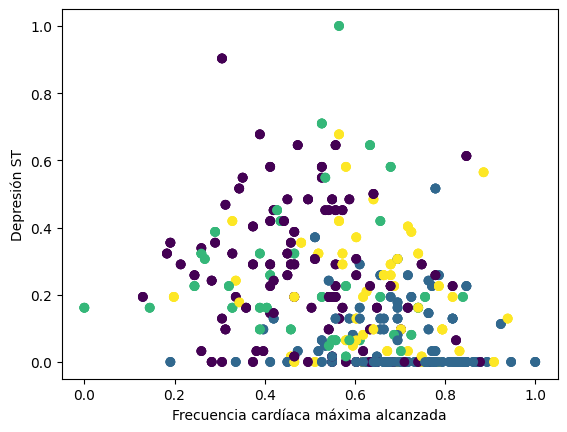

In [41]:
# 1. Inicializar el modelo de k-means
kmeans = KMeans(n_clusters=4)

# 2. Entrenar el modelo
kmeans.fit(X)

# 3. Asignar clusters
labels = kmeans.labels_

# Visualizar los grupos
plt.scatter(X['Frecuencia_cardíaca_máxima_alcanzada'], X['Depresión_ST'], c=labels, cmap='viridis')
plt.xlabel('Frecuencia cardíaca máxima alcanzada')
plt.ylabel('Depresión ST')
plt.show()

